# Pig Report

In [2]:
from utilities import load_value_function, load_value_tracker
from matplotlib import pyplot as plt
import numpy as np
import plotly.graph_objects as go

## Introduction

## Methodology

## Results

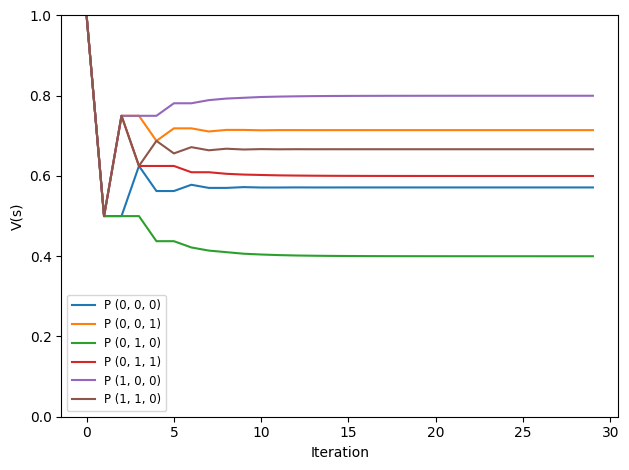

In [3]:
V = load_value_function("data/value_function/piglet/goal_2.json")
value_tracker = load_value_tracker("data/value_function/piglet/value_tracker_goal_2.json")
states = list(V.keys())

## Replicate piglet graph
for i, lst in enumerate(value_tracker):
    y = list(range(len(lst)))
    plt.plot(y, lst, label=f"P {states[i]}")

plt.xlabel("Iteration")
plt.ylabel("V(s)")
plt.legend(fontsize="small")
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [4]:
## Piglet probabilities
print(V)

{(0, 0, 0): 0.5714285708963871, (0, 0, 1): 0.7142857145518064, (0, 1, 0): 0.40000169910490513, (0, 1, 1): 0.6000009682029486, (1, 0, 0): 0.7999987173825502, (1, 1, 0): 0.666666666045785}


In [ ]:
## Pig probabilities for 0,0,0

## Competition code

The following plot shows the boundary surface for the optimal policy. Below the surface, the optimal decision is to roll and above the surface, the optimal decision is to hold.

In [6]:
goal = 100

# Load raw value function from JSON
filename_hold = "data/value_function/pig/hold_100.json"
V_hold = load_value_function(filename_hold)

filename_roll = "data/value_function/pig/roll_100.json"
V_roll = load_value_function(filename_roll)


### 3D boundary graph
# Create 3D grid for each possible state
grid = np.full((goal, goal, goal), np.nan)

# Store the difference in value between holding and rolling for each (i,j,k)
for (i, j, k) in V_hold:
    if i < goal and j < goal and k < goal:
        grid[i, j, k] = V_roll[(i, j, k)] - V_hold[(i, j, k)]

# Prepare axis ranges
X, Y, Z = np.meshgrid(np.arange(goal), np.arange(goal), np.arange(goal), indexing='ij')

# Replace NaNs with -1 to make it work
safe_grid = np.nan_to_num(grid, nan=-1.0)

# Create the surface plot
fig = go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=safe_grid.flatten(),
    isomin=0,
    isomax=0,
    surface_count=1,
    colorscale="Viridis",
    caps=dict(x_show=False, y_show=False, z_show=False),
    showscale=False
))

fig.update_layout(
    title='Roll/hold boundary for optimal Pig policy',
    scene=dict(
        xaxis_title='Player 1 Score (i)',
        yaxis_title='Player 2 Score (j)',
        zaxis_title='Turn Score (k)'
    )
)

fig.show()

The next graph shows the optimal policy boundary against the reachable region if player 1 follows the optimal policy and if player 2 has a score of 30. 

In [9]:
goal = 100
j = 30

# Load reachability
filename = f"data/reachable/pig/goal_{goal}_opponent_score_30.json"
reachable = load_value_function(filename)

# Build 2D reachability matrix (k, i)
reachable_matrix = np.zeros((goal, goal)) 
for i in range(goal):
    for k in range(goal):
        reachable_matrix[k, i] = reachable.get((i, j, k), 0)

# Load value functions
V_hold = load_value_function("data/value_function/pig/hold_100.json")
V_roll = load_value_function("data/value_function/pig/roll_100.json")

# Build difference grid
grid = np.full((goal, goal, goal), np.nan)
for (i, j, k) in V_hold:
    if i < goal and j < goal and k < goal:
        grid[i, j, k] = V_roll[(i, j, k)] - V_hold[(i, j, k)]

# Extract policy boundary cross-section at j = 30 (and transpose)
cross_section = grid[:, 30, :]         
cross_section_transposed = cross_section.T 

# Create plot
fig = go.Figure()

# Add heatmap of reachable states
fig.add_trace(go.Heatmap(
    z=reachable_matrix,
    colorscale='Blues',
    colorbar=dict(title='Reachable'),  
    showscale=False,                   
    opacity=0.6,
    zmin=0,
    zmax=1,
    name='Reachable Region',           
    showlegend=False
))

# Add policy boundary as contour at value = 0
fig.add_trace(go.Contour(
    z=cross_section_transposed,
    contours=dict(
        start=0, end=0, size=1,
        coloring='none',
        showlabels=False
    ),
    line_width=2,
    line_color='black',
    showscale=False,
    name='Optimal Policy Boundary', 
    showlegend=False
))

# Add the hold at 20 line
fig.add_trace(go.Scatter(x=[0, reachable_matrix.shape[1]-1],
    y=[20, 20],
    mode='lines',
    line=dict(color='grey', width=2, dash='dash'),
    name='Hold at 20 Policy',
    showlegend=False
))


# Reachable Region Key
fig.add_trace(go.Scatter(x=[None], y=[None], mode='markers', 
                         marker=dict(size=10, color='#617ba2', opacity=1), name='Reachable Region'))

# Boundary Key
fig.add_trace(go.Scatter(x=[None], y=[None], mode='lines', 
                         line=dict(color='black', width=2), name='Policy Boundary'))

# Hold at 20 Key
fig.add_trace(go.Scatter(x=[None], y=[None], mode='lines', 
                         line=dict(color='grey', width=2, dash='dash'), name='Hold at 20 Policy'))

# Layout
fig.update_layout(
    title=f"Reachable States and Policy Boundary at j = 30",
    xaxis_title='Player 1 Score (i)',
    yaxis_title='Turn Total (k)',
    width=800,
    height=700,
    legend=dict(
        x=1.02, y=1,
        bordercolor="black",
        borderwidth=1
    )
)

fig.show()


## Discussion

## Reference

Neller, T. W., & Presser, C. G. (2004). Optimal play of the dice game pig. *The UMAP Journal*, 25(1).